In [17]:
from fastai.vision.widgets import *
from fastai.vision.all import Path, load_learner, PILImage


In [6]:
path = Path('data/mushroom_classification_data_cleaned/')
Path.BASE_PATH = path

In [7]:
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [10]:
learn_inf = load_learner(path/'export.pkl')

In [11]:
learn_inf.dls.vocab

(#73) ['Agaricus_augustus','Albatrellus_confluens','Albatrellus_ovinus','Amanita_ceciliae','Amanita_fulva','Amanita_muscaria','Amanita_virosa','Armillaria_mellea','Auriscalpium_vulgare','Bankera_fuligineoalba'...]

In [12]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [39]:
img = PILImage.create(btn_upload.data[-1])

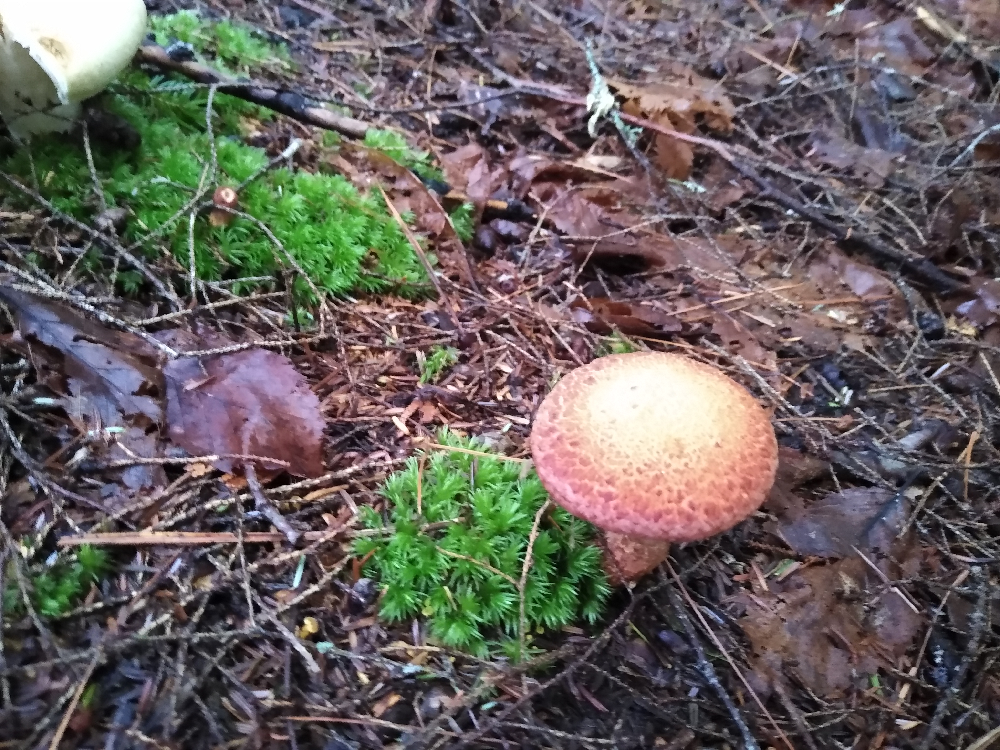

In [40]:
img

In [41]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(224,224))
out_pl

Output()

In [22]:
pred,pred_idx,probs = learn_inf.predict(img)

In [34]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: Bankera_fuligineoalba; Probability: 0.3602')

In [31]:
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [32]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [43]:
VBox([widgets.Label('Upload your mushroom!'), 
      btn_upload, btn_run, out_pl, lbl_pred])

In [44]:
!pip install voila
!jupyter serverextension enable voila —sys-prefix

     |████████████████████████████████| 5.9 MB 1.6 MB/s eta 0:00:01
     |████████████████████████████████| 183 kB 19.5 MB/s eta 0:00:01
Enabling: voila
- Writing config: /Users/baranserajelahi/.jupyter
    - Validating...
      voila 0.1.22 OK
Enabling: —sys-prefix
- Writing config: /Users/baranserajelahi/.jupyter
    - Validating...
Error loading server extension —sys-prefix
      X is —sys-prefix importable?
